# Importing the data

In [3]:
import csv
import random
import numpy as np
import pandas as pd

from os import listdir
from os.path import isfile, join
from collections import Counter

In [4]:
!wget https://archive.ics.uci.edu/static/public/205/opinrank+review+dataset.zip
!unzip opinrank+review+dataset.zip

--2024-05-01 22:20:45--  https://archive.ics.uci.edu/static/public/205/opinrank+review+dataset.zip
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified
Saving to: ‘opinrank+review+dataset.zip’

opinrank+review+dat     [    <=>             ]  97.53M  1.24MB/s    in 4m 39s  

2024-05-01 22:25:26 (358 KB/s) - ‘opinrank+review+dataset.zip’ saved [102271253]

Archive:  opinrank+review+dataset.zip
 extracting: OpinRankDataset.pdf     
 extracting: OpinRankDataset.zip     


In [5]:
!unzip -q -o "OpinRankDataset.zip" -d "OpinRankDataset"

In [4]:
# Data source: https://archive.ics.uci.edu/dataset/205/opinrank+review+dataset

parent_path = "OpinRankDataset/hotels/new-york-city"
files = [
    join(parent_path, f) 
    for f in listdir(parent_path) 
    if isfile(join(parent_path, f))
]
# Consolidating all hotel reviews into one dataframe
print(f"Fetched reviews for {len(files)} hotels in New York City\n")
df = pd.DataFrame()
for f in files:
    df = pd.concat(
        [
            df, 
            pd.read_csv(
                f, sep="\t", encoding="latin", quoting=csv.QUOTE_NONE,#csv.QUOTE_NONE, 
                index_col=False, names=["date", "title", "review"], header=None
            )
        ], ignore_index=True)

print(df.head())

Fetched reviews for 258 hotels in New York City

           date                                              title  \
0   Nov 18 2009                   Mary's Going Off to College Bash   
1   Nov 5 2009    The standard you would expect but the price.....   
2  Oct 26 2009   Honestly? For a St Regis it was very disappoin...   
3  Oct 19 2009                                         Outstanding   
4  Oct 15 2009                             I've got a butler!!??!!   

                                              review  
0  Neal Buker etc. We didn't have much of a view ...  
1  It is a very nice hotel....as you would expect...  
2  I stayed in St Regis halfway through my trip i...  
3  We visit NYC twice a year and always stay at t...  
4  We stayed at the St. Regis for 3 nights with o...  


In [5]:
# Checking the status of all reviews
reviews = df["review"].dropna()
lens = [len(rev.strip()) for rev in reviews]
print(f"""
    Total number of reviews are: {len(reviews)}
    Shortest review length: {min(lens)} chars
    Longest review length: {np.median(lens)} chars
    Mean review length: {np.mean(lens)} chars
    Median review length: {max(lens)} chars
    """)

# Assigning ID into each reviews
id_review = {k: v for k, v in enumerate(reviews)}


    Total number of reviews are: 50656
    Shortest review length: 10 chars
    Longest review length: 793.0 chars
    Mean review length: 980.9229311433986 chars
    Median review length: 19846 chars
    


# Sentiment analysis

In [8]:
! pip install textblob==0.17.1

  Obtaining dependency information for textblob==0.17.1 from https://files.pythonhosted.org/packages/44/a4/595b66c1342a830f4ff476307c4367541cce3e361b9ee96d22a5eeeddd1d/textblob-0.17.1-py2.py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 636.8/636.8 kB 1.6 MB/s eta 0:00:00a 0:00:01m


In [6]:
from textblob import TextBlob

In [7]:
sentiment = {}
for rev_id, rev in id_review.items():
    pol = TextBlob(rev).sentiment.polarity
    if pol > 0:
        sent = "positive"
    elif pol < 0:
        sent = "negative"
    else:
        sent = "neutral"
    sentiment[rev_id] = {"class": sent, "polarity": pol}

In [8]:
# Counting positive, negative, and neutral sentiments
sent_classes = [sent["class"] for _, sent in sentiment.items()]
print(f"Sentiment distribution: {Counter(sent_classes)}")

Sentiment distribution: Counter({'positive': 47976, 'negative': 2618, 'neutral': 62})


In [9]:
print("\nPositive\n", random.sample(
    [id_review[i] for i in sentiment if sentiment[i]["class"]=="positive"], 10)
)
print("\nNeutral\n", random.sample(
    [id_review[i] for i in sentiment if sentiment[i]["class"]=="neutral"], 10)
)
print("\nNegative\n", random.sample(
    [id_review[i] for i in sentiment if sentiment[i]["class"]=="negative"], 10)
)


Positive
 ["This hotel is a quaint &quot;New York Boutique&quot; style hotel. We booked this for our first trip to New York City for our 25th anniversary. I went on the recommendation of a co-worker and are we glad I did. The property was immaculate and amenities were bountiful. From a continental breakfast to the wine and cheese reception every night as well as a 24 hour reception area with snacks and light drinks available...all included in the price of the hotel. There is easy access to computers and printers, a rooftop sitting area and a wonderful 2nd floor reception area. Also, we mentioned the occassion when we booked the hotel and a nice card and small gift was waiting in our room on arrival. Great touch!The rooms are small, which I am told is typical New York, but they were well appointed and pristine.The location is right on 41st and Madison Ave. Easy walking distance to Grand Central Station, 5th Avenue Shopping, Times Square, Rockefeller Plaza, Park Ave. New York Public Lib

In [10]:
negative_ids = []
positive_ids = []

for rev_id in sentiment:
    if sentiment[rev_id]["class"] == "negative":
        negative_ids.append(rev_id)
    if sentiment[rev_id]["class"] == "positive":
        positive_ids.append(rev_id)

## Plot positive and negative review to word clouds

In [17]:
! pip install wordcloud
! pip install nltk

  Obtaining dependency information for wordcloud from https://files.pythonhosted.org/packages/ac/66/937d1d73389c0b501c928c4d8513653063d2b40272dff70d0e283d8b9144/wordcloud-1.9.3-cp311-cp311-macosx_11_0_arm64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.3/168.3 kB 6.9 MB/s eta 0:00:00


In [11]:
import string
import nltk
from matplotlib import pyplot as plt
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from wordcloud import WordCloud


# Global and Vars

STOP = set(stopwords.words('english'))
PUNCT = set(string.punctuation)
LEMMA = WordNetLemmatizer()
WC = WordCloud(
    mode = "RGBA", collocations = False, background_color = None, 
    width=1500, height=1000
)

# Functions

def clean(doc):
    stop_free = " ".join(
        [i for i in doc.lower().split() if i not in STOP]
    )
    punc_free = "".join(
        [ch for ch in stop_free if ch not in PUNCT]
    )
    normalized = " ".join(
        LEMMA.lemmatize(word) for word in punc_free.split()
    )
    
    return " ".join([i for i in normalized.split() if len(i)>1])

def plot_wc(text_list):
    word_cloud = WC.generate(" ".join(text_list))
    plt.figure( figsize=(30,20) )
    # Display the generated Word Cloud
    plt.imshow(word_cloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

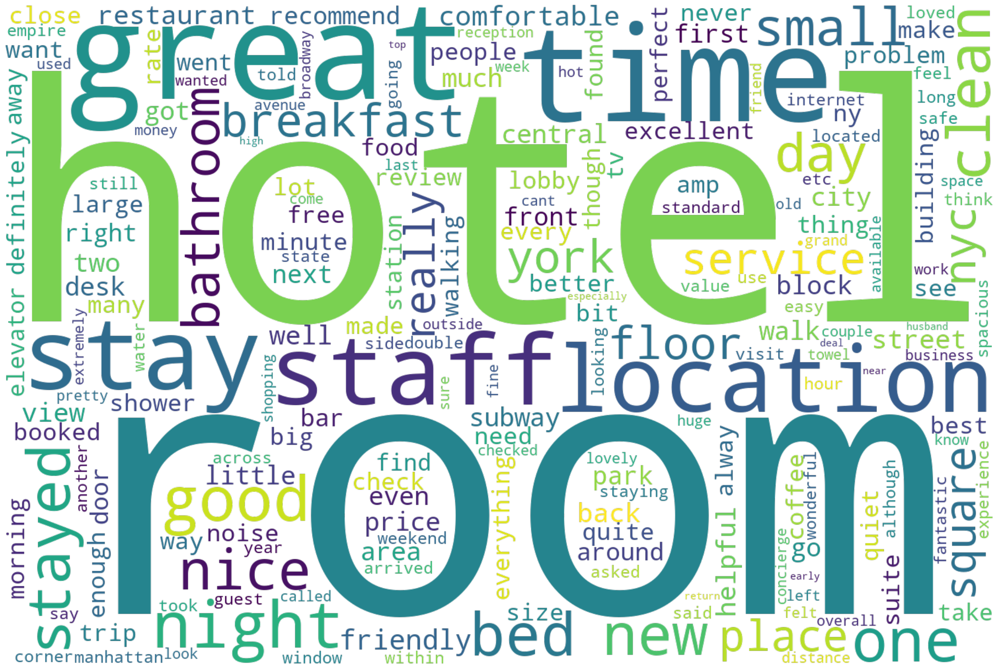

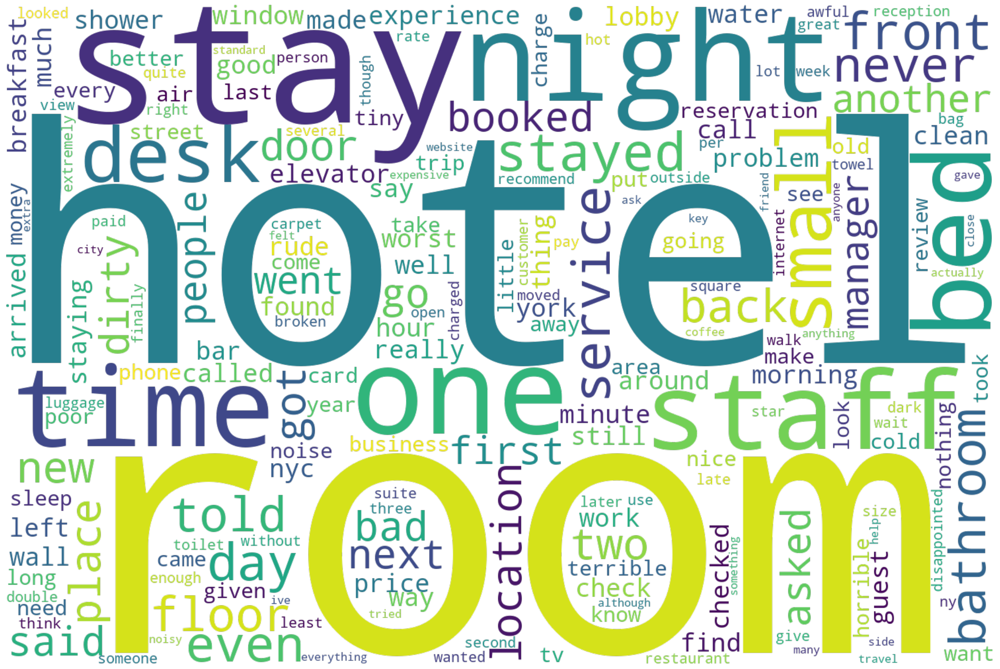

In [23]:
# positives
plot_wc([clean(id_review[i]) for i in positive_ids])
# negatives
plot_wc([clean(id_review[i]) for i in negative_ids])

# We can see that the room and hotel are highest occuring words in reviews.
# There are some irrelevant words, such as next, much, want, etc showing in the cloud 
# Then, we retain only nouns and plot word clouds again.

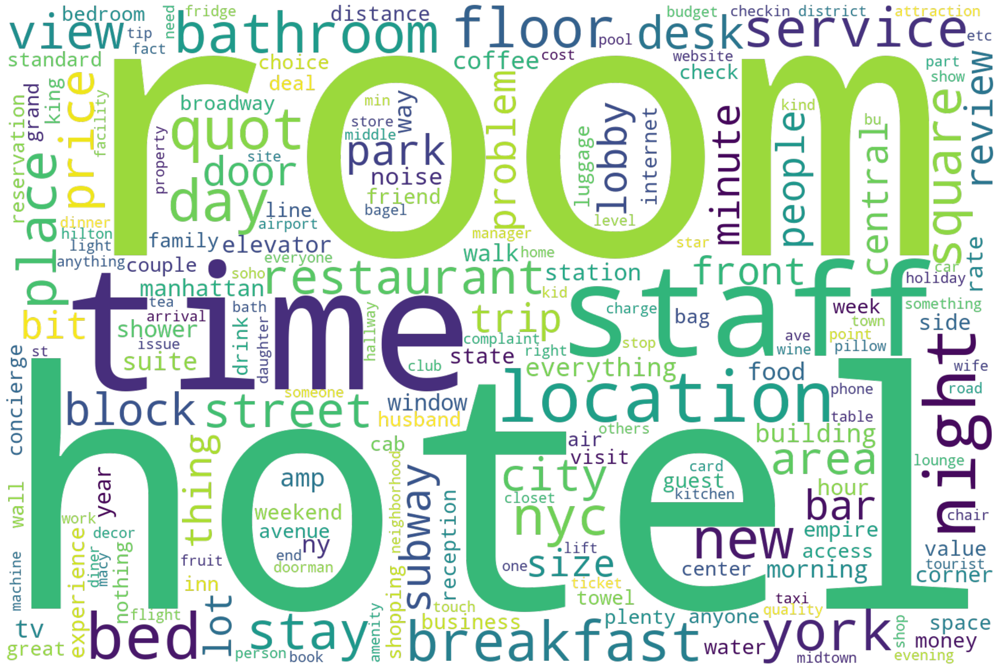

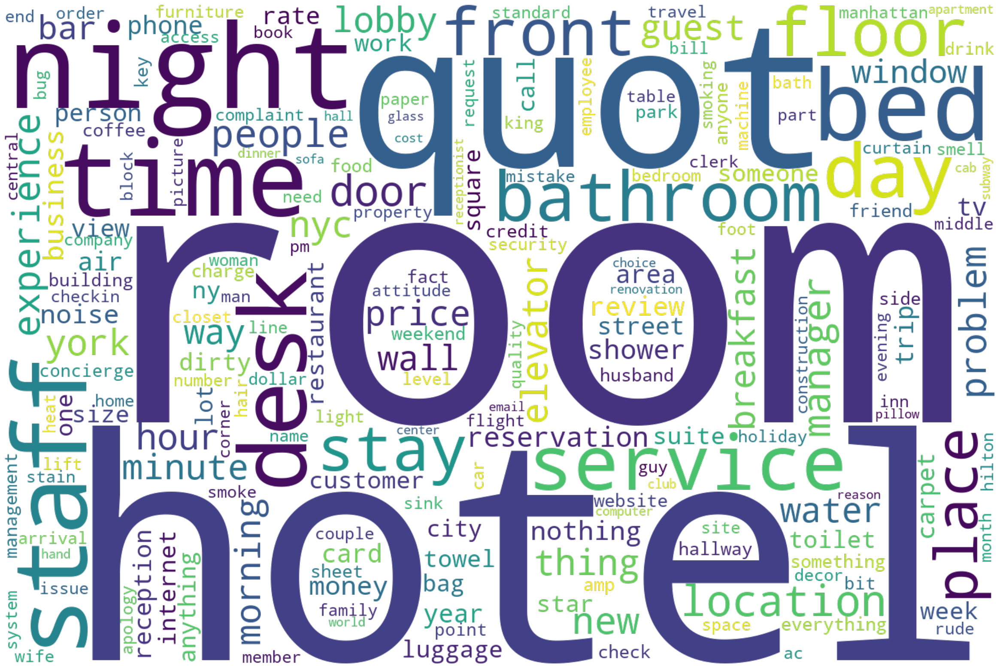

In [26]:
from nltk import word_tokenize
from nltk import pos_tag
def noun_clean(x):
    """
    Retain only nouns and get pass through cleaning function
    """
    tokens = word_tokenize(x)
    tags = pos_tag(tokens)
    nouns = [
        word 
        for word, pos in tags 
        if (
            pos == 'NN' 
            or pos == 'NNP' 
            or pos == 'NNS' 
            or pos == 'NNPS'
        )
    ]
    return clean(" ".join(nouns))

# positives
noun_pos = [
    noun_clean(id_review[rev_id]) 
    for rev_id in positive_ids
]
plot_wc(noun_pos)
# negatives
noun_neg = [
    noun_clean(id_review[rev_id]) 
    for rev_id in negative_ids
]
plot_wc(noun_neg)

# Hotel and room are the top words showing in the cloud. 
# We remove those and plot word clouds again to get a better sense of remaining themes.
# Furthermore, we remove any words less than 2 characters in length

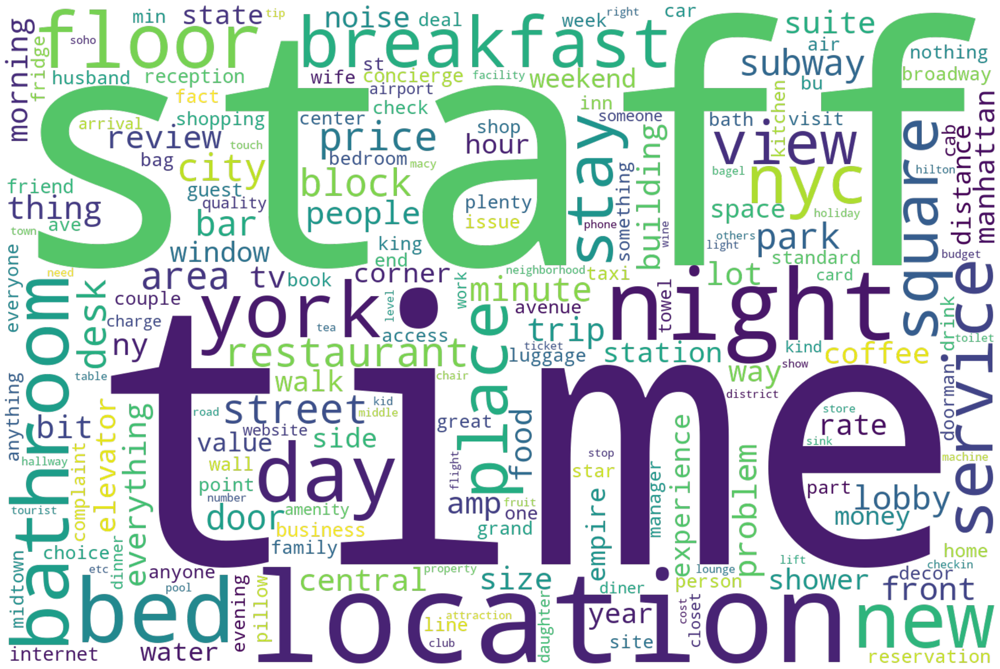

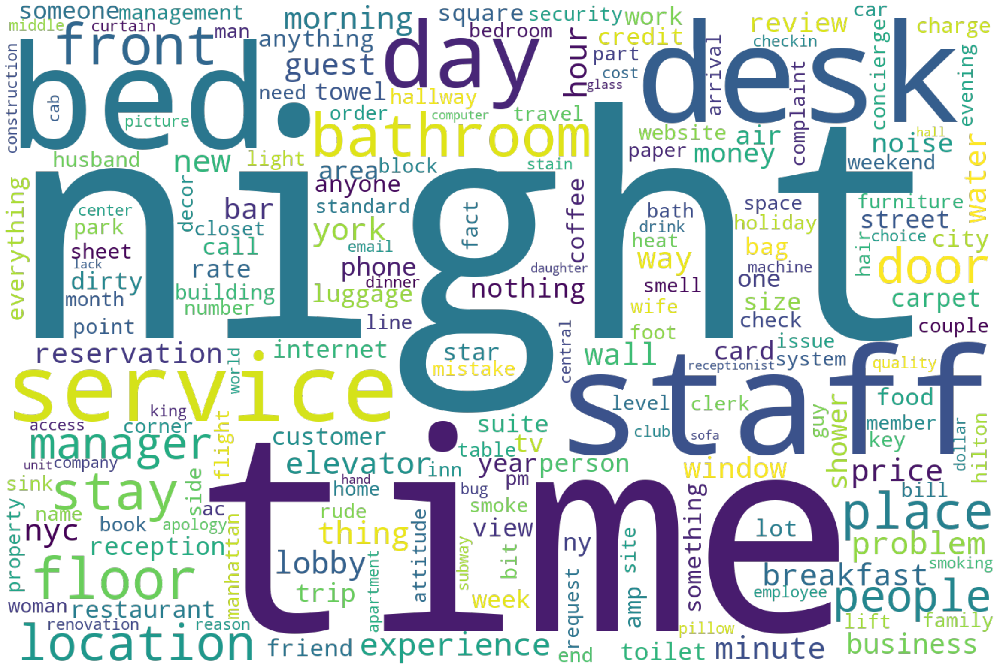

In [27]:
clean_pos = [
    " ".join(
        [
            j for j in i.split() 
            if j not in [
                "room", "hotel", "quot"
            ] and len(j) >= 2
        ]
    ) for i in noun_pos
]
plot_wc(clean_pos)

clean_neg = [
    " ".join(
        [
            j for j in i.split() 
            if j.lower() not in [
                "room", "hotel", "quot"
            ] and len(j) >= 2
        ]
    ) 
    for i in noun_neg
]
plot_wc(clean_neg)

# We can see that some common words showing in both positive and negative reviews.
# Other important words seem to be related to "room" such as staff & service, location.

# Taking a subset for training

In [12]:
subset = set(random.sample(list(id_review.keys()), int(len(id_review)*0.75)))

negative_ids_subset = [rev_id for rev_id in negative_ids if rev_id in subset]
positive_ids_subset = [rev_id for rev_id in positive_ids if rev_id in subset]
print(f"""
    Taking a subset of {len(positive_ids_subset)} positive sentiment reviews 
    and {len(negative_ids_subset)} negative sentiment reviews"""
)
print(f"{len(subset)=}")


    Taking a subset of 35977 positive sentiment reviews 
    and 1966 negative sentiment reviews
len(subset)=37992


# Splitting reviews into phrases/sentences

Since each review can contain multiple topics, we split the reviews into phrases using SENT_SPLIT. 
E.g. If review ID 8 corresponds to review "Close to central park. I threw a wonderful event there and the staff couldn't be more helpful.",
new_id_docs will represent it as (8, ["close", "central", "park"]), (8, ["threw", "wonderful", "event", "staff", "helpful"])

In [13]:
import re

SENT_SPLIT = ',|\.|\?|\!|\n'

new_id_docs = []
for rev_id, rev in id_review.items():
    if rev_id in subset:
        rev_split = re.split(SENT_SPLIT, rev)
        for phrase in rev_split:
            # get each word in the cleaned phrase
            words = clean(phrase).split()
            # only select cleaned phrases 
            # that contain more than 2 words
            if len(words) > 2:
                new_id_docs.append((rev_id, words))

In [14]:
loc_set = {"location"}
room_set = {"room", "bed", "bathroom", "bedroom"}
serv_set = {"service", "staff"}

def filter_by_words(new_id_docs, word_set):
    return [
        itm for itm in new_id_docs 
        if any(w in itm[1] for w in word_set)
    ]

location = filter_by_words(new_id_docs, loc_set)
room = filter_by_words(new_id_docs, room_set)
serv = filter_by_words(new_id_docs, serv_set)

In [14]:
remove_set = {"hotel"}

def clean_training_samples(id_words, remove_words):
    nouns = [
        noun_clean(
            " ".join([
                w for w in word_list
                if w not in remove_words
            ])
        )
        for _, word_list in id_words
    ]
    return nouns

print("\nFor location\n")
plot_wc(clean_training_samples(
    location, set.union(remove_set, loc_set))
)
print("\nFor room\n")
plot_wc(clean_training_samples(
    room,  set.union(remove_set, room_set))
)
print("\nFor staff and service\n")
plot_wc(clean_training_samples(
    serv, set.union(remove_set, serv_set))
)



For location



NameError: name 'noun_clean' is not defined

In [15]:
loc_set = {
    "location", "subway", "walking", "street", "block",
    "distance", "walk", "park", "midtown", "manhattan",
    "empire", "avenue", "shop", "attraction"
}
loc_set_dual = {"time", "square"}
location_train = []
for rev_id, word_list in new_id_docs:
    for loc_word in loc_set:
        if loc_word in word_list:
            location_train.append(
                (rev_id, word_list) #[w for w in word_list if w != loc_word])
            )
    if len(
        [w for w in loc_set_dual if w in word_list]
    ) == loc_set_dual:
            location_train.append(
                (
                    rev_id,  
                    word_list
                    #[
                    #    w for w in word_list 
                    #    if w not in loc_set_dual
                    #]
                )
            )
print(len(location), len(location_train))

18237 87684


In [16]:
room_set = {
    "bath", "floor", "shower", "window", "space", 
    "room", "bed", "bathroom", "bedroom"
}
room_train = []
for rev_id, word_list in new_id_docs:
    for room_word in room_set:
        if room_word in word_list:
            room_train.append(
               (rev_id,  word_list) #[w for w in word_list if w != room_word])
           )
print(len(room), len(room_train))

103647 141949


In [17]:
serv_set = {
    "service", "staff", "reception", "concierge", 
    "desk", "front", "helpful", "customer", "breakfast", 
    "food", "restaurant", "problem", "polite", "help"
}
serv_train = []
for rev_id, word_list in new_id_docs:
    for serv_word in serv_set:
        if serv_word in word_list:
            serv_train.append(
                (rev_id, word_list) #[w for w in word_list if w != serv_word])
            )
print(len(serv), len(serv_train))

33676 105808


# Prepare data to pass into the classifier

In [18]:
cleaned_data = (
    [
        (" ".join(word_list), "staff_serv") 
        for _, word_list in serv_train 
        if len(word_list) > 2
    ] + [
        (" ".join(word_list), "loc") 
        for _, word_list in location_train
        if len(word_list) > 2
    ] + [
        (" ".join(word_list), "room") 
        for _, word_list in room_train
        if len(word_list) > 2
    ]
)

random.shuffle(cleaned_data)
x = [itm[0] for itm in cleaned_data]
y = [itm[1] for itm in cleaned_data]

In [19]:
# Checking random samples of training data for manual verification
random_room = random.sample([i for i in cleaned_data if i[1]=="room"], 10)
random_ss = random.sample([i for i in cleaned_data if i[1]=="staff_serv"], 10)
random_loc = random.sample([i for i in cleaned_data if i[1]=="loc"], 10)
print(f"room: {random_room}\n\nstaff_serv: {random_ss}\n\nloc: {random_loc}")

room: [('got corner room 57th top floor quotspectacularquot their description', 'room'), ('one small pod single room', 'room'), ('paid 195 usd room four people', 'room'), ('macys near penn station time square within easy walking distance subway station cornerwe found hotel clean bed clothes changed every day', 'room'), ('asked manager kyle stay higher floor put 18 floor', 'room'), ('chelsea lodge everything need nyc exploring time warm room bed want end day', 'room'), ('smelly old especially carpet bathroom', 'room'), ('downside sharing double bed room clothes case wasnt much storage space etchotel great location main site walking distance', 'room'), ('upon closer inspection notice trhe trim work done around window', 'room'), ('separate shower big enough fit party', 'room')]

staff_serv: [('room service come quotshangquot restaurant downstairs', 'staff_serv'), ('infortunately dialed number spoke guy front desk', 'staff_serv'), ('good value hotel clean room helpful staff', 'staff_serv')

# Mutlinomial NB classifier with hyperparameter tuning

Best alpha: 0.1
Avg. Precision: 0.9057726926096437
Avg. Recall: 0.9057964965836325
Avg. F1: 0.9057420595716459


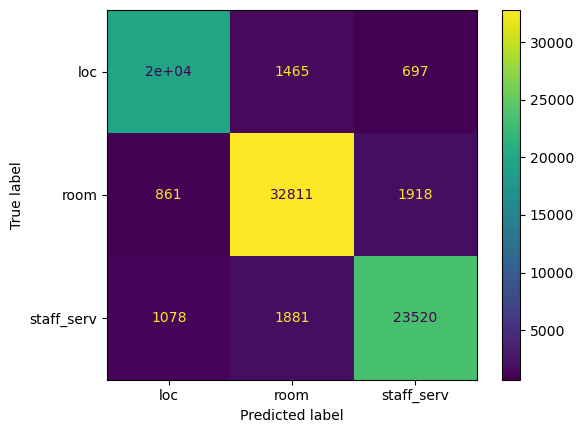

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import precision_recall_fscore_support, confusion_matrix, ConfusionMatrixDisplay

# Split data into training and validation sets
train_x, valid_x, train_y, valid_y = train_test_split(x, y)

# Vectorize text data
vectorizer = TfidfVectorizer(max_df=0.9, min_df=0.01, max_features=5000)
X_train = vectorizer.fit_transform(train_x)
X_valid = vectorizer.transform(valid_x)

# Define Multinomial Naive Bayes model
def multinomialBN_model(X_train, train_y, X_valid, valid_y, alpha=1.0):
    # Fit model
    model = MultinomialNB(alpha=alpha).fit(X_train, train_y)
    # Predict labels
    y_pred = model.predict(X_valid)
    # Calculate evaluation metrics
    prec, recall, f1, _ = precision_recall_fscore_support(valid_y, y_pred, average='weighted')
    scores = {
        "precision": prec,
        "recall": recall,
        "f1": f1
    }
    return model, scores, y_pred

# Train multiple models with different alpha values
models = {}
for alpha in [0.1, 0.2, 0.4, 0.6, 0.8, 1.0]:
    models[alpha] = multinomialBN_model(X_train, train_y, X_valid, valid_y, alpha=alpha)

# Find the best model based on F1 score
f1_max = max([models[alpha][1]["f1"] for alpha in models])
best_alpha, best_model, best_score, y_pred = [
    (alpha, models[alpha][0], models[alpha][1], models[alpha][2])
    for alpha in models if models[alpha][1]["f1"]==f1_max
][0]

# Print evaluation metrics
print(f"Best alpha: {best_alpha}")
print(f"Avg. Precision: {best_score['precision']}")
print(f"Avg. Recall: {best_score['recall']}")
print(f"Avg. F1: {best_score['f1']}")

# Plot confusion matrix
cm = confusion_matrix(valid_y, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(valid_y))
disp.plot()

# Logistic Regression

Avg. Precision: 0.646689497716895
Avg. Recall: 0.646689497716895
Avg. F1: 0.646689497716895


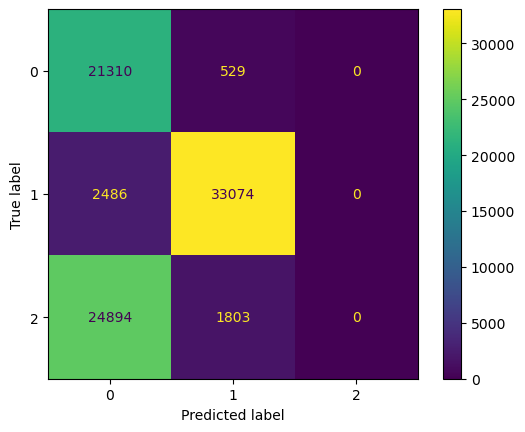

In [38]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_recall_fscore_support, confusion_matrix, ConfusionMatrixDisplay

# Split data into training and validation sets
train_x, valid_x, train_y, valid_y = train_test_split(x, y)

# Encode labels
encoder = LabelEncoder()
train_y = encoder.fit_transform(train_y)
valid_y = encoder.transform(valid_y)

# Vectorize text data
vectorizer = TfidfVectorizer(max_df=0.9, min_df=0.01, max_features=5000)
X_train = vectorizer.fit_transform(train_x)
X_valid = vectorizer.transform(valid_x)

# Define Logistic Regression model
def logistic_regression_model(X_train, train_y, X_valid, valid_y):
  # Fit model
  model = LogisticRegression(max_iter=1000).fit(X_train, train_y)
  # Predict labels (Logistic Regression predicts probabilities by default)
  y_pred = model.predict_proba(X_valid)[:, 1]  # Select probability for positive class
  # Convert probabilities to class labels (optional, based on your needs)
  y_pred_class = np.where(y_pred > 0.5, 1, 0)  # Threshold at 0.5 for binary classification

  # Calculate evaluation metrics (assuming binary classification)
  prec, recall, f1, _ = precision_recall_fscore_support(valid_y, y_pred_class, average='micro')
  scores = {
      "precision": prec,
      "recall": recall,
      "f1": f1
  }
  return model, scores, y_pred, y_pred_class  # Return both probability predictions and class labels

# Train the model
model, best_score, y_pred, y_pred_class = logistic_regression_model(X_train, train_y, X_valid, valid_y)

# Print evaluation metrics
print(f"Avg. Precision: {best_score['precision']}")
print(f"Avg. Recall: {best_score['recall']}")
print(f"Avg. F1: {best_score['f1']}")

# Plot confusion matrix (using class labels)
cm = confusion_matrix(valid_y, y_pred_class)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(valid_y))
disp.plot()

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_recall_fscore_support, confusion_matrix, ConfusionMatrixDisplay

# Split data into training and validation sets
train_x, valid_x, train_y, valid_y = train_test_split(x, y, test_size=0.2, random_state=42)

# Encode labels
encoder = LabelEncoder()
train_y = encoder.fit_transform(train_y)
valid_y = encoder.transform(valid_y)

# Vectorize text data
vectorizer = TfidfVectorizer(max_df=0.9, min_df=0.01, max_features=5000)
X_train = vectorizer.fit_transform(train_x)
X_valid = vectorizer.transform(valid_x)

# Hyperparameter tuning (if desired)
param_grid = {'n_neighbors': [3, 5, 7]}  # Adjust hyperparameters as needed
grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5)
grid_search.fit(X_train, train_y)
best_model = grid_search.best_estimator_

# Define KNN model
def knn_model(X_train, train_y, X_valid, valid_y):
    # Fit model
    model = best_model.fit(X_train, train_y)
    # Predict labels
    y_pred = model.predict(X_valid)

    # Calculate evaluation metrics
    prec, recall, f1, _ = precision_recall_fscore_support(valid_y, y_pred, average='weighted')
    scores = {"precision": prec, "recall": recall, "f1": f1}
    return model, scores, y_pred

# Train the model
model, best_score, y_pred = knn_model(X_train, train_y, X_valid, valid_y)

# Print evaluation metrics
print(f"Precision: {best_score['precision']}")
print(f"Recall: {best_score['recall']}")
print(f"F1-score: {best_score['f1']}")

# Plot confusion matrix
cm = confusion_matrix(valid_y, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(valid_y))
disp.plot()

In [39]:
best_model.classes_

array(['loc', 'room', 'staff_serv'], dtype='<U10')

In [40]:
best_model.predict_proba(vectorizer.transform([clean("the parking was good")]))

array([[0.10281911, 0.66343631, 0.23374458]])

In [41]:
best_model.predict_proba(vectorizer.transform([clean("booked this hotel for a stay on friday")]))

array([[0.05118677, 0.35497348, 0.59383975]])

In [42]:
best_model.predict_proba(vectorizer.transform([clean("the bedroom was spacious")]))

array([[0.10650505, 0.76216954, 0.13132541]])

In [43]:
best_model.predict_proba(vectorizer.transform([clean("loved the size and view")]))

array([[0.04902086, 0.92532029, 0.02565886]])

In [44]:
best_model.predict_proba(vectorizer.transform([clean("comfortable sleep")]))

array([[0.01981516, 0.04033202, 0.93985282]])

In [45]:
best_model.predict_proba(vectorizer.transform([clean("very close to downtown")]))

array([[0.04360323, 0.89465403, 0.06174274]])

In [46]:
best_model.predict_proba(vectorizer.transform([clean("very close to downtown and staff was nice too.")]))

array([[0.03086461, 0.65334163, 0.31579377]])

In [47]:
best_model.predict_proba(vectorizer.transform([clean("the stfaf was very friendly")]))

array([[0.0249353 , 0.07984308, 0.89522162]])

In [48]:
best_model.predict_proba(vectorizer.transform([clean("the manager gave us a free upgrade.")]))

array([[0.02900662, 0.05219796, 0.91879542]])

In [49]:
best_model.predict_proba(vectorizer.transform([clean("the frontdesk was talking to us")]))

array([[0.26014713, 0.42303637, 0.3168165 ]])

# Prepare unseen test data

In [50]:
clean_test = {}
for rev_id, rev in id_review.items():
    if rev_id not in subset:
        phrase_list = re.split(SENT_SPLIT, rev)
        clean_test[rev_id] = [
            clean(phr) for phr in phrase_list
        ]

In [51]:
print(f"{len(clean_test)} unseen test samples were prepared")

12664 unseen test samples were prepared


In [52]:
# manual checks on results for deciding thresholds and accuracy
test_model = []
for rev_id in clean_test:
    for phr in clean_test[rev_id]:
        if len(phr.split()) >= 2:
            (p1, p2, p3) = best_model.predict_proba(
                vectorizer.transform([phr])
            )[0]
            test_model.append([rev_id, phr, p1, p2, p3])

In [53]:
print(f"""
    Got {83/88} accuracy on manually checking 88 valid classifications,
    i.e., classifications excluding phrases hat do not belong to any class
    and have a low probability score across classes. The threshold of {0.62} 
    gives us > {95}% good results."""
)



    Got 0.9431818181818182 accuracy on manually checking 88 valid classifications,
    i.e., classifications excluding phrases hat do not belong to any class
    and have a low probability score across classes. The threshold of 0.62 
    gives us > 95% good results.


In [54]:
# Set threshold as decided from the dataset above
# Gather top classifications for the unseen test samples per review.
classes_pred={}
for rev_id in clean_test:
    classes_pred[rev_id] = []
    for phr in clean_test[rev_id]:
        if len(phr.split()) >= 2:
            pred = best_model.predict_proba(
                vectorizer.transform([phr])
            )[0]
            if max(pred) >= 0.62:
                classes_pred[rev_id].append(
                    best_model.classes_[
                        np.where(pred == max(pred))[0][0]
                    ]
                )

In [55]:
# Take a sample of 100 reviews to check results
rand_sample = random.sample(list(classes_pred.keys()), 100)
sample_classifications = []
for rev_id in rand_sample:
    sample_classifications.append(
        [
            rev_id, 
            id_review[rev_id], 
            Counter(classes_pred[rev_id]).most_common(),
            sentiment[rev_id]["class"]
        ]
    )

In [56]:
for samp in sample_classifications[0:5]:
    print(samp)

[40577, 'We have just returned from 4 nights at the Belleclaire having got a great internet rate on a family suite. The hotel is situated in a nice part of town on the Upper West Side, a few blocks from Central Park and the Natural History Museum and within walking distance of some great bars, restaurants and good shops and close to lines 1,2,3 and 9 on the subway. The staff were generally helpful and friendly.The hotel itself is basic but spotlessly clean, with comfy beds and a nice bathroom. The rooms were cleaned everyday and we were given new bedding and towels each day. There was quite a bit of noise from the street below (despite being on the 9th floor) but I guess you get that anywhere in New York.Our suite was supposed to be for 6 people which would have been a real squash, but for 3 of us, it was very roomy. I would definitely stay there again, although next time I might be tempted to try somewhere further south in Manhattan as getting downtown was a bit of a trek (though stil

In [57]:
import pickle

# to save
with open('hotel_NBclf.pkl','wb') as f:
    pickle.dump(best_model, f)

# to load
"""
# load
with open('model.pkl', 'rb') as f:
    clf2 = pickle.load(f)
"""

"\n# load\nwith open('model.pkl', 'rb') as f:\n    clf2 = pickle.load(f)\n"

## LDA topic modeling 

In [58]:
import gensim
from gensim import corpora

# Creating the object for LDA model using gensim library
lda = gensim.models.ldamodel.LdaModel

In [59]:
dictionary_pos = corpora.Dictionary(
    [phr_list for _, phr_list in new_id_docs]
)
test_matrix = [
    (rev_id, dictionary_pos.doc2bow(phr_list)) 
    for rev_id, phr_list in new_id_docs
]
doc_term_matrix=[itm[1] for itm in test_matrix]

In [60]:
# Running and Training LDA model on the document term matrix for 2 topics.
lda_2 = lda(
    doc_term_matrix, 
    num_topics=2, 
    id2word=dictionary_pos,
    passes=10)
# Results
for itm in lda_2.print_topics():
    print(itm)
    print("\n")
# room, staff, service -> 0
# location -> 1

(0, '0.025*"room" + 0.015*"staff" + 0.009*"day" + 0.009*"get" + 0.008*"breakfast" + 0.007*"one" + 0.007*"could" + 0.007*"service" + 0.006*"friendly" + 0.006*"restaurant"')


(1, '0.054*"hotel" + 0.030*"room" + 0.016*"stay" + 0.016*"great" + 0.015*"time" + 0.012*"would" + 0.012*"new" + 0.011*"bed" + 0.011*"stayed" + 0.011*"location"')




In [61]:
# Running and Training LDA model on the document term matrix for 3 topics.
lda_3 = lda(
    doc_term_matrix, 
    num_topics=3, 
    id2word=dictionary_pos, 
    passes=10
)
# Results
for itm in lda_3.print_topics():
    print(itm)
    print("\n")
    
# location -> 0
# room -> 1
# staff and service -> 2

(0, '0.038*"hotel" + 0.022*"would" + 0.021*"staff" + 0.014*"stay" + 0.009*"back" + 0.009*"friendly" + 0.009*"desk" + 0.008*"get" + 0.008*"helpful" + 0.008*"night"')


(1, '0.043*"hotel" + 0.028*"time" + 0.021*"great" + 0.019*"new" + 0.018*"stayed" + 0.017*"location" + 0.014*"york" + 0.014*"night" + 0.012*"place" + 0.012*"nyc"')


(2, '0.084*"room" + 0.017*"bed" + 0.015*"floor" + 0.014*"small" + 0.014*"nice" + 0.013*"bathroom" + 0.013*"breakfast" + 0.012*"clean" + 0.008*"comfortable" + 0.007*"also"')




In [62]:
# Creating the object for LDA model using gensim library
lda = gensim.models.ldamodel.LdaModel
# Running and Training LDA model on the document term matrix for 3 topics.
lda_model_pos_4 = lda(doc_term_matrix, num_topics=4, id2word = dictionary_pos, passes=10)
# Results
for itm in lda_model_pos_4.print_topics():
    print(itm)
    print("\n")
# staff and service -> 0
# room -> 2
# location ->3

(0, '0.090*"room" + 0.029*"staff" + 0.023*"bed" + 0.018*"small" + 0.018*"nice" + 0.017*"bathroom" + 0.016*"clean" + 0.012*"friendly" + 0.012*"desk" + 0.012*"helpful"')


(1, '0.033*"night" + 0.026*"stayed" + 0.025*"hotel" + 0.022*"room" + 0.022*"day" + 0.019*"breakfast" + 0.017*"service" + 0.015*"floor" + 0.011*"one" + 0.011*"bar"')


(2, '0.028*"great" + 0.026*"hotel" + 0.025*"location" + 0.021*"time" + 0.016*"view" + 0.015*"square" + 0.014*"walk" + 0.014*"street" + 0.013*"block" + 0.011*"minute"')


(3, '0.052*"hotel" + 0.026*"stay" + 0.026*"would" + 0.019*"new" + 0.015*"york" + 0.013*"place" + 0.012*"nyc" + 0.012*"could" + 0.012*"get" + 0.010*"back"')




In [63]:
# Creating the object for LDA model using gensim library
lda = gensim.models.ldamodel.LdaModel
# Running and Training LDA model on the document term matrix for 3 topics.
lda_model_pos_5 = lda(doc_term_matrix, num_topics=5, id2word = dictionary_pos, passes=10)
# Results
for itm in lda_model_pos_5.print_topics():
    print(itm)
    print("\n")
# location -> 0
# room -> 1
# room -> 2
# staff -> 3

(0, '0.043*"time" + 0.038*"hotel" + 0.028*"great" + 0.027*"location" + 0.016*"square" + 0.015*"restaurant" + 0.015*"walk" + 0.015*"street" + 0.014*"block" + 0.012*"subway"')


(1, '0.054*"room" + 0.030*"floor" + 0.026*"breakfast" + 0.022*"service" + 0.020*"view" + 0.019*"good" + 0.017*"nice" + 0.015*"bar" + 0.014*"great" + 0.010*"rate"')


(2, '0.028*"room" + 0.022*"bed" + 0.017*"back" + 0.015*"comfortable" + 0.013*"get" + 0.012*"day" + 0.012*"shower" + 0.011*"check" + 0.010*"could" + 0.009*"one"')


(3, '0.042*"room" + 0.040*"staff" + 0.032*"new" + 0.024*"york" + 0.023*"bathroom" + 0.022*"clean" + 0.022*"hotel" + 0.019*"small" + 0.017*"friendly" + 0.016*"well"')


(4, '0.059*"hotel" + 0.031*"stay" + 0.030*"would" + 0.027*"night" + 0.023*"room" + 0.022*"stayed" + 0.014*"nyc" + 0.011*"one" + 0.010*"like" + 0.009*"much"')




In [64]:
from operator import itemgetter 

topic_loc = []
for i in range(len(test_matrix)):
    q = lda_model_pos_5[test_matrix[i][1]]
    res = max(q, key = itemgetter(1))[0]
    if res == 0:
        topic_loc.append(new_id_docs[i])

In [65]:
rand_sample_loc = random.sample(topic_loc, 100) # for checking manually
df_loc_5 = pd.DataFrame(rand_sample_loc, columns=["id", "words"])
df_loc_5.to_csv("loc_5_manual_test.csv")

In [66]:
print(f"""On manually checking 100 samples, {72}% 
    were found to be related to topic location"""
)

On manually checking 100 samples, 72% 
    were found to be related to topic location


# Transformer

We finetune BERT with the same problem we specified for the ML models above, and see if a better result can be resulted. 

In [22]:
from sklearn.preprocessing import LabelEncoder
train_x, _, train_y, _ =train_test_split(x,y, test_size=0.9)
label_encoder = LabelEncoder()
label_encoder.fit(train_y)
labels_train = label_encoder.transform(train_y)
labels_valid = label_encoder.transform(valid_y)

In [23]:
import torch
from tqdm.notebook import tqdm

from transformers import BertTokenizer
from torch.utils.data import TensorDataset

from transformers import BertForSequenceClassification

Before flowing into the pretrained BERT pipeline, the sentences are converted into embeddings with a Fast BERT Tokenizer

In [24]:
from transformers import BertTokenizerFast

model_name = "google/bert_uncased_L-4_H-512_A-8"
tokenizer = BertTokenizerFast.from_pretrained(model_name)

train_encodings = tokenizer(train_x, truncation=True, padding='max_length', max_length=128)
val_encodings = tokenizer(valid_x, truncation=True, padding='max_length', max_length=128)

In [31]:
import torch

class MyDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = MyDataset(train_encodings, labels_train)
val_dataset = MyDataset(val_encodings, labels_valid)

In [26]:
import numpy as np
import evaluate

metric = evaluate.load("accuracy")
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    return metric.compute(predictions=predictions, references=labels)

Below, the pretrained model is obtained and finetuned for 1 epoch (given time constraint)

In [27]:
model = BertForSequenceClassification.from_pretrained("bert-base-uncased",
                                                      num_labels=3,
                                                      output_attentions=False,
                                                      output_hidden_states=False)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [32]:
for param in model.base_model.parameters():
    param.requires_grad = False

In [33]:
from transformers import Trainer, TrainingArguments

training_args = TrainingArguments(
    output_dir='./results_prob1',          # output directory
    evaluation_strategy="epoch",     # Evaluation is done at the end of each epoch.
    num_train_epochs=1,              # total number of training epochs
    per_device_train_batch_size=16,  # batch size per device during training
    per_device_eval_batch_size=64,   # batch size for evaluation
    warmup_steps=500,                # number of warmup steps for learning rate scheduler
    weight_decay=0.01,               # strength of weight decay
    save_total_limit=1,              # limit the total amount of checkpoints. Deletes the older checkpoints.    
)


trainer = Trainer(
    model=model,                         # the instantiated 🤗 Transformers model to be trained
    args=training_args,                  # training arguments, defined above
    train_dataset=train_dataset,         # training dataset
    eval_dataset=val_dataset,            # evaluation dataset
    compute_metrics=compute_metrics,     
)

trainer.train()

  0%|          | 0/6291 [00:00<?, ?it/s]

{'loss': 1.0773, 'grad_norm': 3.99886417388916, 'learning_rate': 5e-05, 'epoch': 0.24}
{'loss': 1.0345, 'grad_norm': 2.415708541870117, 'learning_rate': 4.568295631151788e-05, 'epoch': 0.48}
{'loss': 0.9937, 'grad_norm': 2.1288371086120605, 'learning_rate': 4.1365912623035744e-05, 'epoch': 0.72}
{'loss': 0.9703, 'grad_norm': 3.197216033935547, 'learning_rate': 3.704886893455362e-05, 'epoch': 0.95}


  0%|          | 0/1311 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [34]:
pred = trainer.predict(val_dataset)

In [38]:
logits, labels = pred[0], pred[1]
predictions = np.argmax(logits, axis=-1)

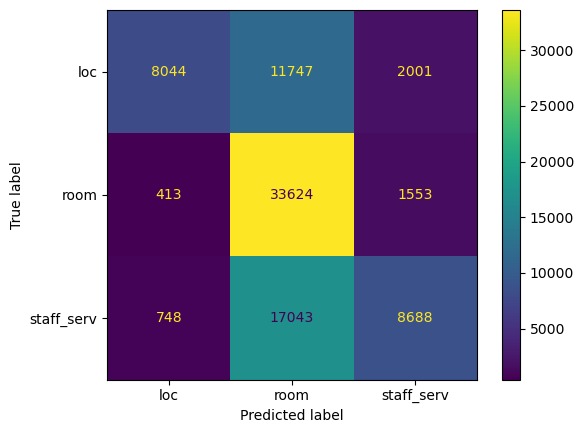

In [39]:
from sklearn.metrics import ConfusionMatrixDisplay,confusion_matrix
cm = confusion_matrix(labels_valid, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_encoder.classes_)
disp.plot()

In [40]:
from sklearn.metrics import classification_report
print(classification_report(labels_valid, predictions, target_names=label_encoder.classes_))

              precision    recall  f1-score   support

         loc       0.87      0.37      0.52     21792
        room       0.54      0.94      0.69     35590
  staff_serv       0.71      0.33      0.45     26479

    accuracy                           0.60     83861
   macro avg       0.71      0.55      0.55     83861
weighted avg       0.68      0.60      0.57     83861



We notice an accuracy score at 60%. Which is just comparable to logistic reg and somewhat lower than the naive bayes model, we note the small amount of data given to train the model and it was able to generalize and maintain a stable performance with a large unseen test set. 

We also test a different appraoch with transformer models, where we directly tokenize the complete sentence with BERT and use the embeddings to classify the topic of each sentence.  
The dataset is regenerated with complete sentences without PoS cropping. 

In [4]:
serv_set = {
    "service", "staff", "reception", "concierge", 
    "desk", "front", "helpful", "customer", "breakfast", 
    "food", "restaurant", "problem", "polite", "help"
}

loc_set = {
    "location", "subway", "walking", "street", "block",
    "distance", "walk", "park", "midtown", "manhattan",
    "empire", "avenue", "shop", "attraction", "time square"
}

room_set = {
    "bath", "floor", "shower", "window", "space", 
    "room", "bed", "bathroom", "bedroom"
}

def categorize_comment(comment):
    words = comment.lower().split()
    
    serv_counter = sum(word in serv_set for word in words)
    loc_counter = sum(word in loc_set for word in words)
    room_counter = sum(word in room_set for word in words)
    
    counters = {"serv_staff": serv_counter, "loc": loc_counter, "room": room_counter}
    
    # Sort categories by count in descending order
    sorted_categories = sorted(counters.items(), key=lambda item: item[1], reverse=True)
    
    # If the highest count is at least 2, return the corresponding category
    if sorted_categories[0][1] >= 2:
        return sorted_categories[0][0]
    
    return "uncategorized"

# Apply the function to each comment in id_review
categorized_reviews = {id: categorize_comment(review) for id, review in id_review.items()}

In [5]:
import re
sentences_for_topic = []
categorized_topic = []

for review in id_review.values():
    # Split the review into sentences
    sentences = re.split(r'[.!?]', review)
    
    for sentence in sentences:
        category = categorize_comment(sentence)
        if category != "uncategorized":
            sentences_for_topic.append(sentence)
            categorized_topic.append(category)

In [6]:
pd.Series(categorized_topic).value_counts()

serv_staff    29798
room          27823
loc           19762
Name: count, dtype: int64

In [7]:
from sklearn.preprocessing import LabelEncoder

# Create an instance of LabelEncoder
label_encoder = LabelEncoder()

# Encode the categorical labels
numerical_labels = label_encoder.fit_transform(categorized_topic)


With transformer, we will start with a pretrained model and so we only finetune with an extremely small subset from the training data. We take 8% of the data, which is even smaller than the test set (!)

In [36]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(sentences_for_topic, numerical_labels, test_size=0.2, random_state=42)
X_train, _, y_train ,_ = train_test_split(sentences_for_topic, numerical_labels, test_size=0.9, random_state=42)

In [79]:
%pip install transformers torch -q

Note: you may need to restart the kernel to use updated packages.


In [24]:
%pip install evaluate -q

Note: you may need to restart the kernel to use updated packages.


In [27]:
%pip install "urllib3<2" -q

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
anaconda-cloud-auth 0.1.3 requires pydantic<2.0, but you have pydantic 2.7.1 which is incompatible.
gradio 4.28.3 requires urllib3~=2.0, but you have urllib3 1.26.18 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [37]:
import torch
from tqdm.notebook import tqdm

from transformers import BertTokenizer
from torch.utils.data import TensorDataset

from transformers import BertForSequenceClassification

Before flowing into the pretrained BERT pipeline, the sentences are converted into embeddings with a Fast BERT Tokenizer

In [38]:
from transformers import BertTokenizerFast

model_name = "google/bert_uncased_L-4_H-512_A-8"
tokenizer = BertTokenizerFast.from_pretrained(model_name)

train_encodings = tokenizer(X_train, truncation=True, padding='max_length', max_length=128)
val_encodings = tokenizer(X_test, truncation=True, padding='max_length', max_length=128)

In [39]:
import torch

class MyDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = MyDataset(train_encodings, y_train)
val_dataset = MyDataset(val_encodings, y_test)

In [40]:
import numpy as np
import evaluate

metric = evaluate.load("accuracy")
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    return metric.compute(predictions=predictions, references=labels)

Below, the pretrained model is obtained and finetuned for 3 epochs

In [41]:
model = BertForSequenceClassification.from_pretrained("bert-base-uncased",
                                                      num_labels=3,
                                                      output_attentions=False,
                                                      output_hidden_states=False)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [42]:
for param in model.base_model.parameters():
    param.requires_grad = False

In [43]:
from transformers import Trainer, TrainingArguments

training_args = TrainingArguments(
    output_dir='./results',          # output directory
    evaluation_strategy="epoch",     # Evaluation is done at the end of each epoch.
    num_train_epochs=3,              # total number of training epochs
    per_device_train_batch_size=16,  # batch size per device during training
    per_device_eval_batch_size=64,   # batch size for evaluation
    warmup_steps=500,                # number of warmup steps for learning rate scheduler
    weight_decay=0.01,               # strength of weight decay
    save_total_limit=1,              # limit the total amount of checkpoints. Deletes the older checkpoints.    
)


trainer = Trainer(
    model=model,                         # the instantiated 🤗 Transformers model to be trained
    args=training_args,                  # training arguments, defined above
    train_dataset=train_dataset,         # training dataset
    eval_dataset=val_dataset,            # evaluation dataset
    compute_metrics=compute_metrics,     
)

trainer.train()

  0%|          | 0/1452 [00:00<?, ?it/s]

  0%|          | 0/242 [00:00<?, ?it/s]

{'eval_loss': 1.048457145690918, 'eval_accuracy': 0.4748336240873554, 'eval_runtime': 214.6437, 'eval_samples_per_second': 72.106, 'eval_steps_per_second': 1.127, 'epoch': 1.0}
{'loss': 1.0916, 'grad_norm': 2.7654058933258057, 'learning_rate': 5e-05, 'epoch': 1.03}


  0%|          | 0/242 [00:00<?, ?it/s]

{'eval_loss': 0.9855955839157104, 'eval_accuracy': 0.605672934031143, 'eval_runtime': 238.5774, 'eval_samples_per_second': 64.872, 'eval_steps_per_second': 1.014, 'epoch': 2.0}
{'loss': 1.0202, 'grad_norm': 2.2532613277435303, 'learning_rate': 2.373949579831933e-05, 'epoch': 2.07}


  0%|          | 0/242 [00:00<?, ?it/s]

{'eval_loss': 0.9666345715522766, 'eval_accuracy': 0.6300316598824062, 'eval_runtime': 248.7185, 'eval_samples_per_second': 62.227, 'eval_steps_per_second': 0.973, 'epoch': 3.0}
{'train_runtime': 1109.1648, 'train_samples_per_second': 20.929, 'train_steps_per_second': 1.309, 'train_loss': 1.0339116078106168, 'epoch': 3.0}


TrainOutput(global_step=1452, training_loss=1.0339116078106168, metrics={'train_runtime': 1109.1648, 'train_samples_per_second': 20.929, 'train_steps_per_second': 1.309, 'train_loss': 1.0339116078106168, 'epoch': 3.0})

In [46]:
pred = trainer.predict(val_dataset)

  0%|          | 0/242 [00:00<?, ?it/s]

In [50]:
logits, labels = pred[0], pred[1]
predictions = np.argmax(logits, axis=-1)

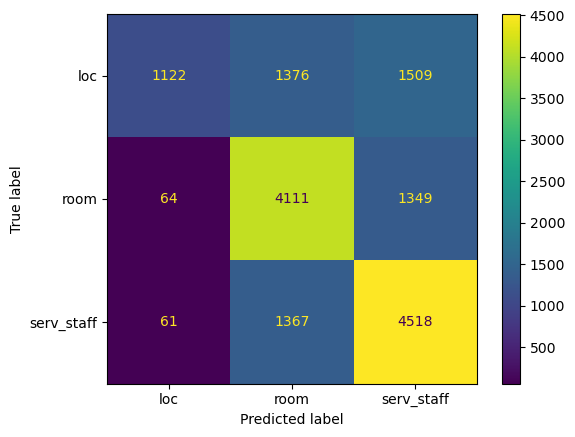

In [54]:
from sklearn.metrics import ConfusionMatrixDisplay,confusion_matrix
cm = confusion_matrix(y_test, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_encoder.classes_)
disp.plot()

In [55]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions, target_names=label_encoder.classes_))

              precision    recall  f1-score   support

         loc       0.90      0.28      0.43      4007
        room       0.60      0.74      0.66      5524
  serv_staff       0.61      0.76      0.68      5946

    accuracy                           0.63     15477
   macro avg       0.70      0.59      0.59     15477
weighted avg       0.68      0.63      0.61     15477



The OOS accuracy is at 63% - not astonishing but it given the small dataset and quick training, with minimal data cleaning, we see the potential as a general model as against linear model which only works well when we are very aware what we are predicting against and perform a very targeted data cleansing